In [1]:
from collections import Counter
from enum import IntFlag
import re

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from wordcloud import WordCloud

# Load the data
NYC employee salary data is public. You can download the data up to the prior fiscal year at https://data.cityofnewyork.us/City-Government/Citywide-Payroll-Data-Fiscal-Year-/k397-673e/about_data .

In [2]:
%%time
salary_data = pd.read_json('https://data.cityofnewyork.us/resource/k397-673e.json?$limit=6000000')

CPU times: user 47.6 s, sys: 13.9 s, total: 1min 1s
Wall time: 2min 45s


Since this is large (hundreds of megabytes)/annoying to download, we'll save it locally as a parquet file.

In [3]:
%%time
salary_data.to_parquet('/mnt/i/data/2023-nyc-salaries.pq')

CPU times: user 7.68 s, sys: 763 ms, total: 8.44 s
Wall time: 9.07 s


In [4]:
!ls -lh /mnt/i/data

total 110M
-rwxrwxrwx 1 nkrishna nkrishna 110M Mar 24 22:55 2023-nyc-salaries.pq


For future tweaks. just run this next line:

In [5]:
%%time
salary_data = pd.read_parquet('/mnt/i/data/2023-nyc-salaries.pq')

CPU times: user 8.28 s, sys: 2.5 s, total: 10.8 s
Wall time: 8.79 s


Next, let's filter the data a bit.  Let's start with 2023 (now, the prior fiscal year)

In [6]:
salary_data1 = salary_data[salary_data.fiscal_year == 2023]
salary_data1.describe()

,fiscal_year,payroll_number,base_salary,regular_hours,regular_gross_paid,ot_hours,total_ot_paid,total_other_pay
count,552938.0,552938.000000,552938.000000,552938.000000,552938.000000,552938.000000,552938.000000,552938.000000
mean,2023.0,573.035691,51337.371450,650.797779,47342.361612,72.551699,4575.784169,4352.708365
std,0.0,307.570095,48070.639384,883.960010,44230.169847,187.328651,12978.876359,7801.349333
min,2023.0,2.000000,1.000000,-1529.270000,-82023.270000,-96.750000,-7096.640000,-205944.480000
25%,2023.0,300.000000,33.180000,0.000000,4913.157500,0.000000,0.000000,0.000000
50%,2023.0,742.000000,48755.000000,0.000000,39244.800000,0.000000,0.000000,662.790000
75%,2023.0,747.000000,92073.000000,1820.000000,84744.340000,1.000000,83.882500,5646.572500
max,2023.0,996.000000,363346.000000,6666.000000,409058.380000,3172.500000,245420.330000,479358.000000


To simplify, let's drop rows with missing values of the Regular Gross Paid

In [7]:
salary_data1 = salary_data1.dropna(subset=['regular_gross_paid'])
salary_data1.regular_gross_paid = salary_data1.regular_gross_paid.astype(int)

In [8]:
salary_data1.describe()

,fiscal_year,payroll_number,base_salary,regular_hours,regular_gross_paid,ot_hours,total_ot_paid,total_other_pay
count,552938.0,552938.000000,552938.000000,552938.000000,552938.000000,552938.000000,552938.000000,552938.000000
mean,2023.0,573.035691,51337.371450,650.797779,47341.943592,72.551699,4575.784169,4352.708365
std,0.0,307.570095,48070.639384,883.960010,44230.161571,187.328651,12978.876359,7801.349333
min,2023.0,2.000000,1.000000,-1529.270000,-82023.000000,-96.750000,-7096.640000,-205944.480000
25%,2023.0,300.000000,33.180000,0.000000,4913.000000,0.000000,0.000000,0.000000
50%,2023.0,742.000000,48755.000000,0.000000,39244.000000,0.000000,0.000000,662.790000
75%,2023.0,747.000000,92073.000000,1820.000000,84744.000000,1.000000,83.882500,5646.572500
max,2023.0,996.000000,363346.000000,6666.000000,409058.000000,3172.500000,245420.330000,479358.000000


In [9]:
salary_data1.columns

Index(['fiscal_year', 'payroll_number', 'agency_name', 'last_name',
       'first_name', 'mid_init', 'agency_start_date', 'work_location_borough',
       'title_description', 'leave_status_as_of_june_30', 'base_salary',
       'pay_basis', 'regular_hours', 'regular_gross_paid', 'ot_hours',
       'total_ot_paid', 'total_other_pay'],
      dtype='object')

We will sort the data by this column as well so we can quickly find quantile boundaries

In [10]:
title_salary = salary_data1.sort_values('regular_gross_paid')

Next, the hard part!  Now we'll make word clouds from titles using the `wordclouds` package, but limit the underlying frequencies to "interesting" phrases.  We'll use the whole title all the time, and optionally either the single-word, double-word, or both substrings of the title as the objects we count.

In [11]:
class NGrams(IntFlag):
    """Flags indicating which n-grams, if any, to include."""

    NONE = 0
    UNI = 1
    BI = 2

In [12]:
def make_wordclouds(title_salary, num_bins = 10, start_quantile = 0, *,
                    add_ngrams: NGrams = NGrams.NONE,
                    stop_list={}):
    """
    :param title_salary: A dataframe including fields "title_description" and "regular_gross_paid".
    :param num_bins: The number of quantile bins to divide the dataset into.
    :param start_quantile: The bin at which to start displaying results. This should be less than `num_bins`.
    :param add_ngrams: A bit flag indicating whether to count unigrams and/or bigrams occurring in titles.
    :param stop_list: a set of tokens to omit from n-grams.
    """
    bin_size = int(len(title_salary) / num_bins)
    boundaries = [None] + list(range(1 * bin_size, num_bins * bin_size, bin_size)) + [None]
    quantiles = []
    for lo, hi in zip(boundaries[:-1], boundaries[1:]):
        quantiles.append(title_salary[lo:hi])


    for idx, quantile in enumerate(quantiles[start_quantile:]):
        wc = WordCloud(width=800, height=400, collocations=False)
    
        counts = Counter()
        total_tokens = 0
        for title in quantile.title_description:
            # Skip rows with missing titles
            if not title:
                continue
            # Some rows use dashes, which we don't care about.
            title = re.sub(r'- *', ' ', title)
            # Now let's count the whole title.  This may be a unigram, bigram, or larger combination of tokens.
            counts[title] += 1
            total_tokens += 1
            if add_ngrams != NGrams.NONE:
                # Tokenize the title
                words = [word for word in title.split() if word and word.lower() not in stop_list]
                if add_ngrams & NGrams.UNI and len(words) > 1:
                    for word in words:
                        counts[word] += 1
                        total_tokens += 1
                if add_ngrams & NGrams.BI and len(words) > 2:
                    for pair in zip(words[:-1], words[1:]):
                        counts[' '.join(pair)] += 1
                        total_tokens += 1
        # Make the word cloud
        wc.generate_from_frequencies({item: count / total_tokens for item, count in counts.items()})
        # Print the title
        print(f'Quantile {start_quantile + idx+1}: {quantile.regular_gross_paid.iloc[0]} - '
              f'{quantile.regular_gross_paid.iloc[-1]}, '
              f'{len(quantile)} salaries')
        display(wc.to_image())

# Full titles
This considers only the frequencies of full title phrases.

## Deciles
This shows word clouds of titles for each decile of pay.

Quantile 1: -82023 - 547, 55293 salaries


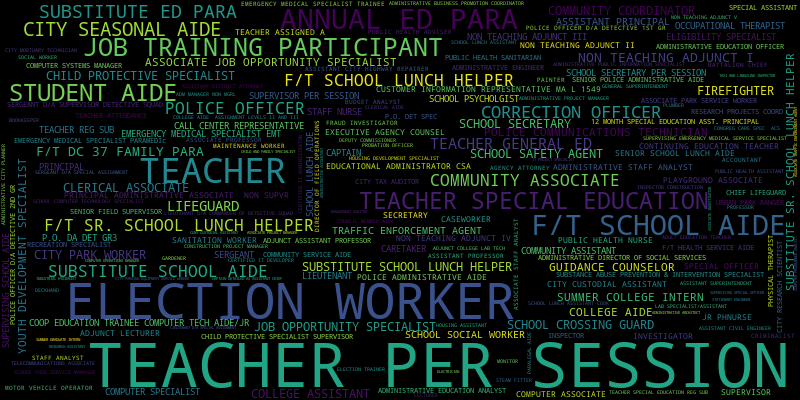

Quantile 2: 547 - 2528, 55293 salaries


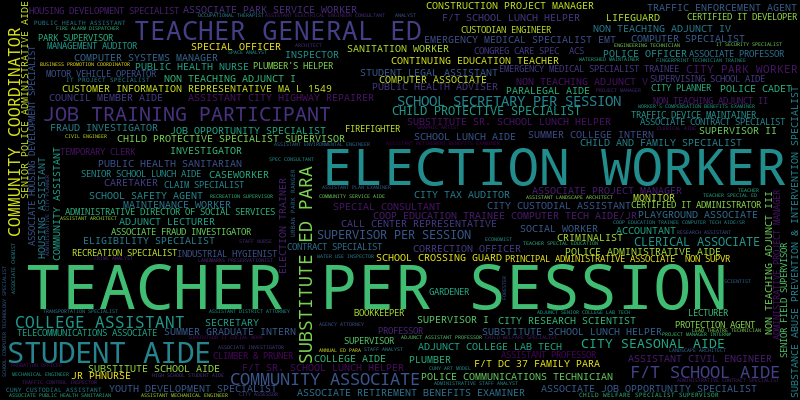

Quantile 3: 2528 - 8267, 55293 salaries


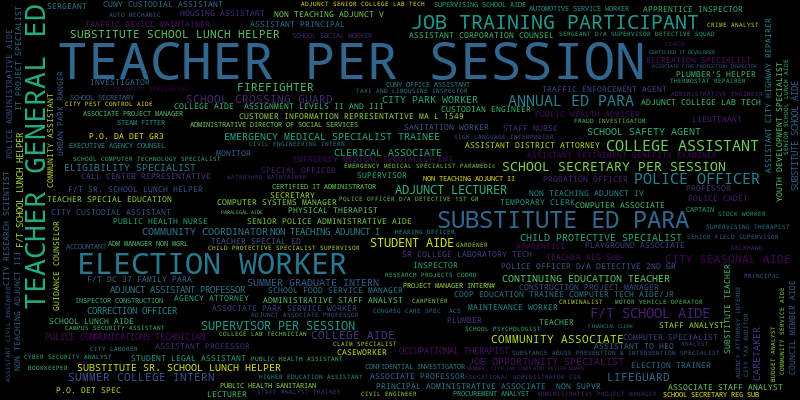

Quantile 4: 8267 - 20432, 55293 salaries


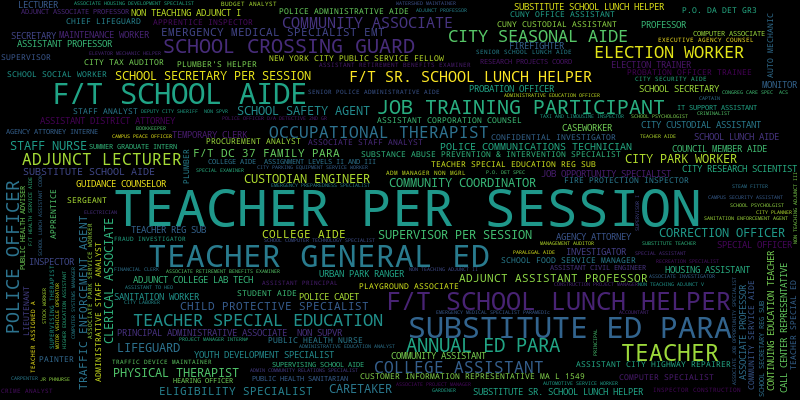

Quantile 5: 20432 - 39242, 55293 salaries


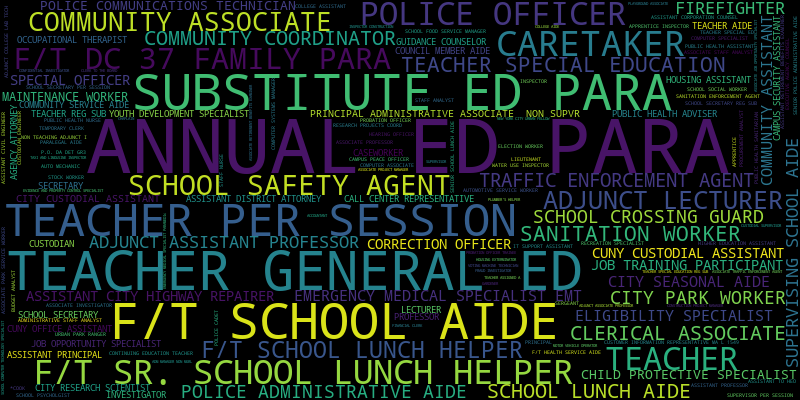

Quantile 6: 39243 - 52545, 55293 salaries


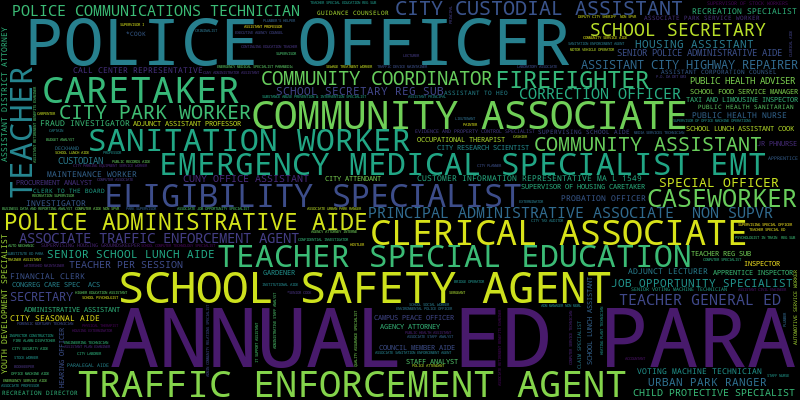

Quantile 7: 52545 - 74253, 55293 salaries


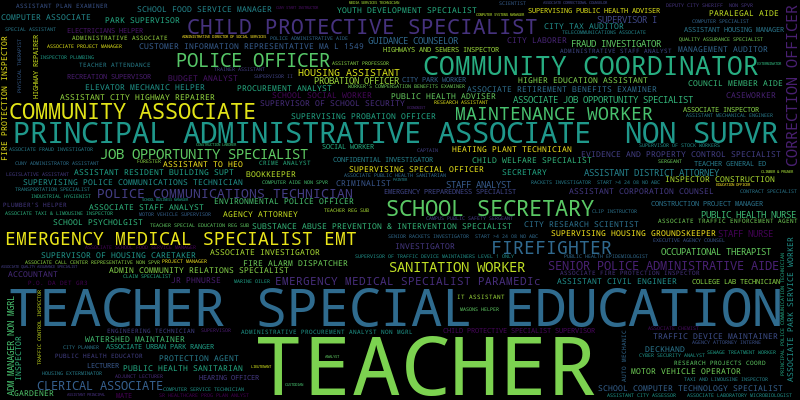

Quantile 8: 74253 - 91444, 55293 salaries


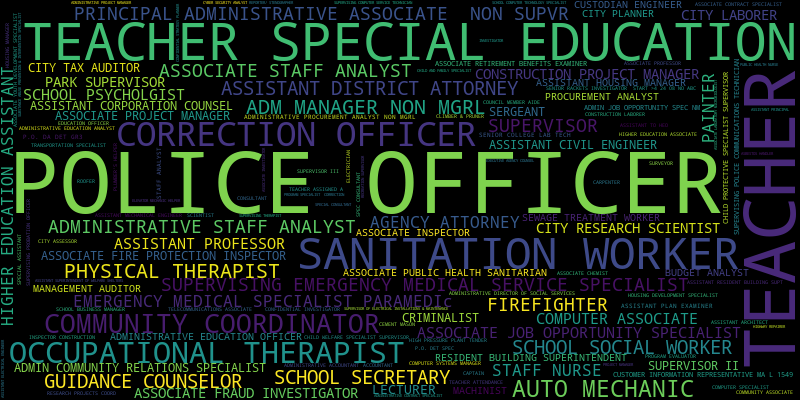

Quantile 9: 91444 - 109852, 55293 salaries


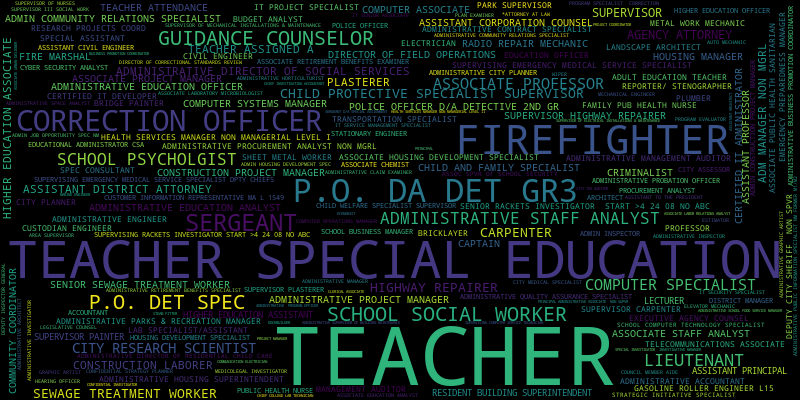

Quantile 10: 109852 - 409058, 55301 salaries


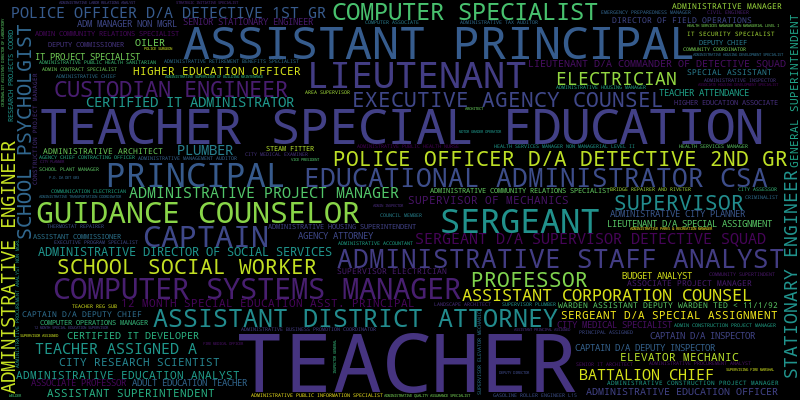

In [13]:
make_wordclouds(title_salary, stop_list={'f/t'})

## Top Decile By Percentile
This shows title wordclouds for each percentile of the top decile.

Quantile 91: 109852 - 111349, 5529 salaries


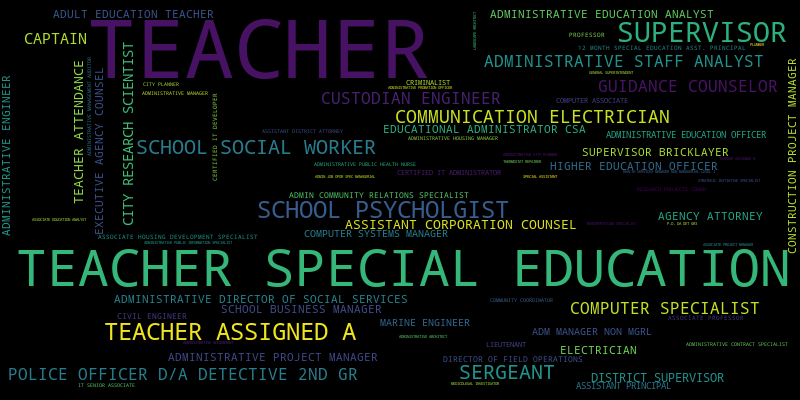

Quantile 92: 111349 - 115764, 5529 salaries


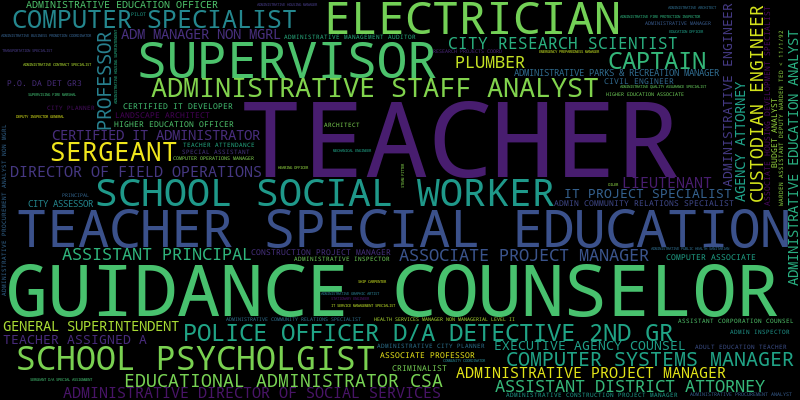

Quantile 93: 115764 - 118509, 5529 salaries


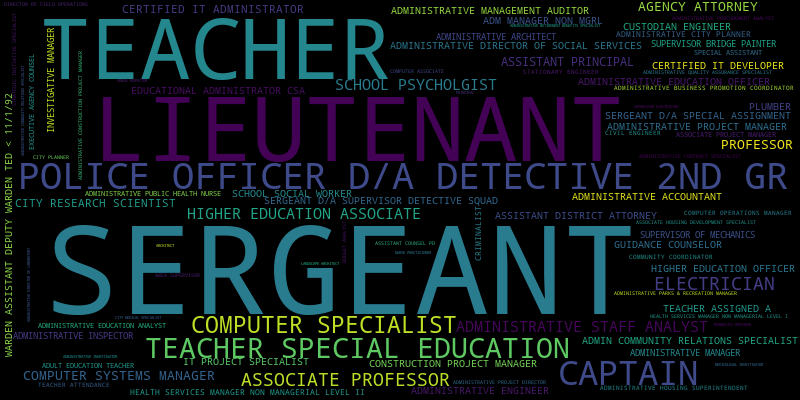

Quantile 94: 118509 - 121611, 5529 salaries


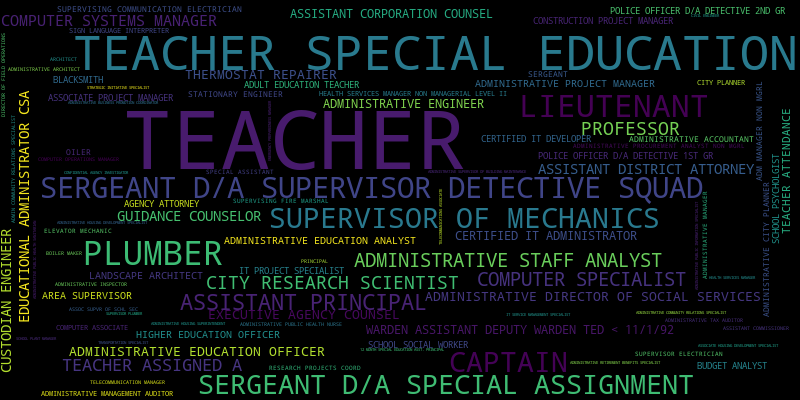

Quantile 95: 121611 - 125756, 5529 salaries


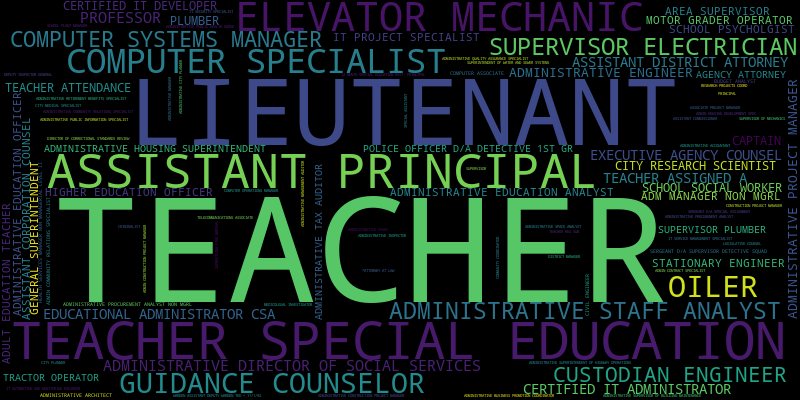

Quantile 96: 125759 - 128657, 5529 salaries


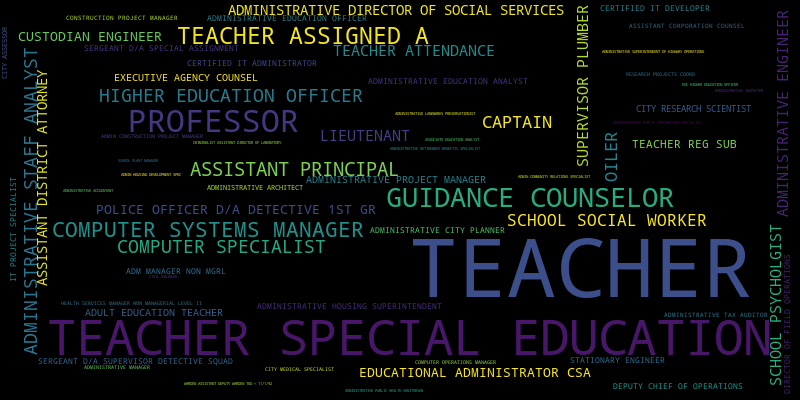

Quantile 97: 128657 - 132288, 5529 salaries


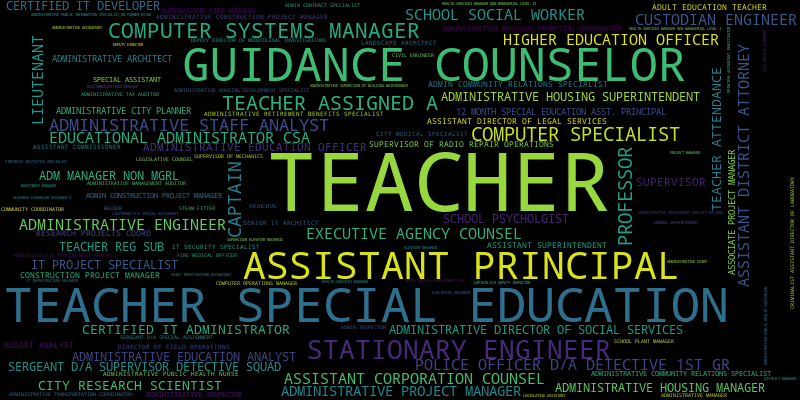

Quantile 98: 132288 - 140532, 5529 salaries


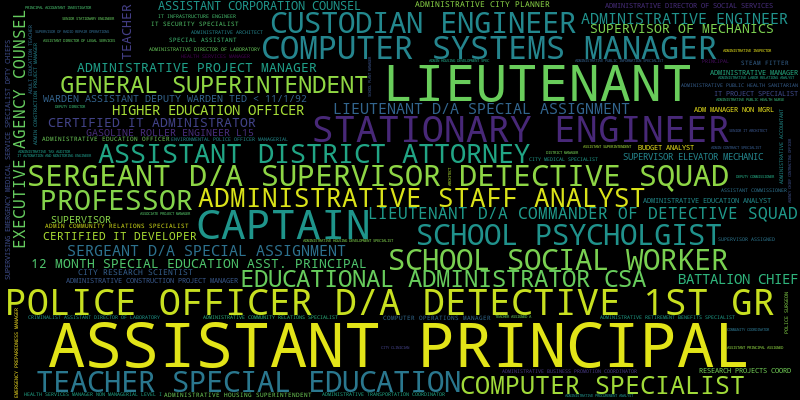

Quantile 99: 140532 - 160962, 5529 salaries


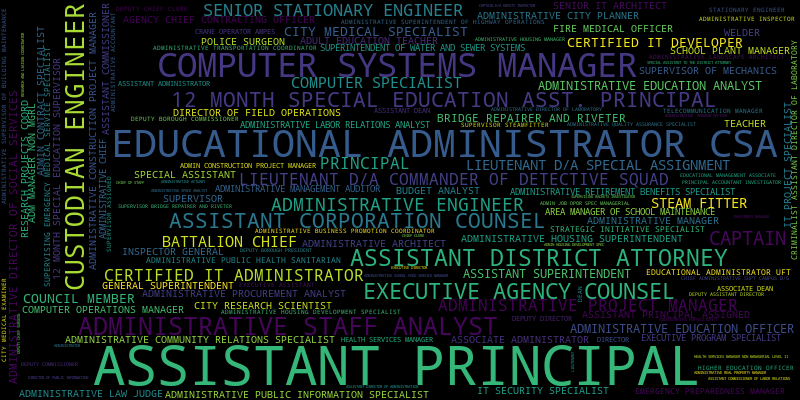

Quantile 100: 160962 - 409058, 5567 salaries


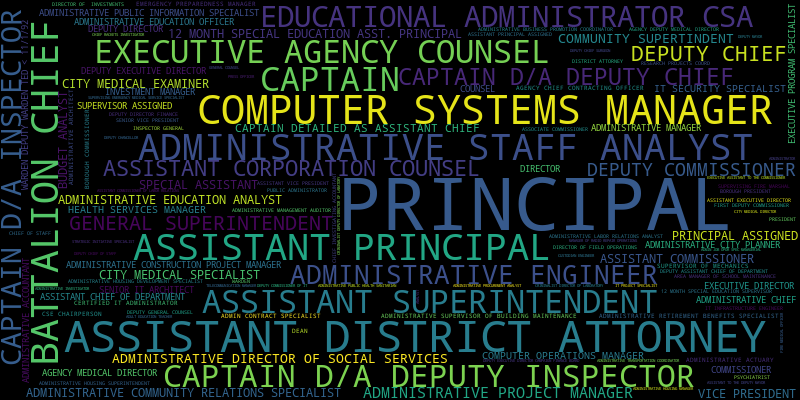

In [14]:
make_wordclouds(title_salary, 100, 90)

## The 1%
This shows title word clouds for each tenth of a percentile of the top percentile.

Quantile 991: 155512 - 158839, 552 salaries


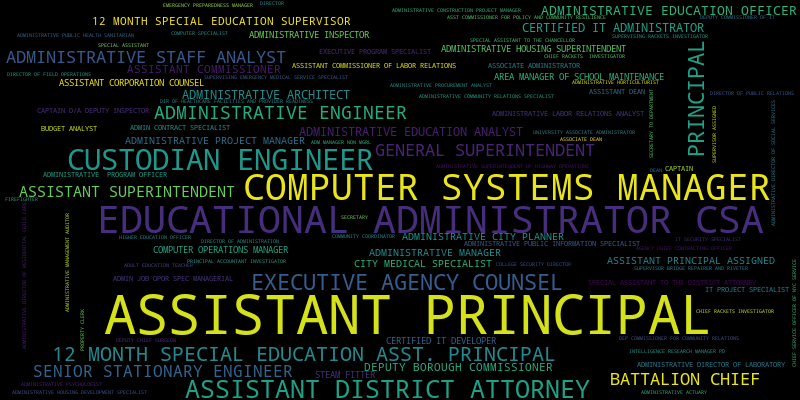

Quantile 992: 158852 - 162839, 552 salaries


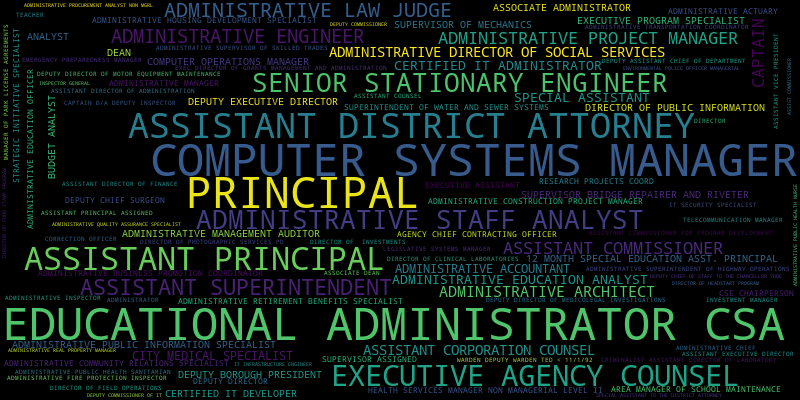

Quantile 993: 162849 - 166786, 552 salaries


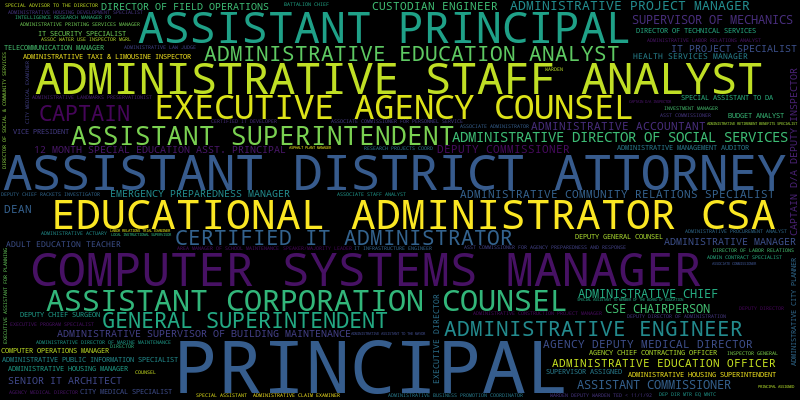

Quantile 994: 166803 - 169834, 552 salaries


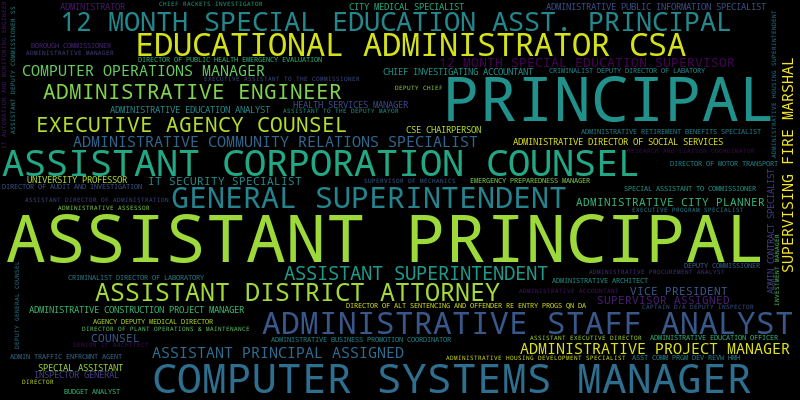

Quantile 995: 169834 - 174520, 552 salaries


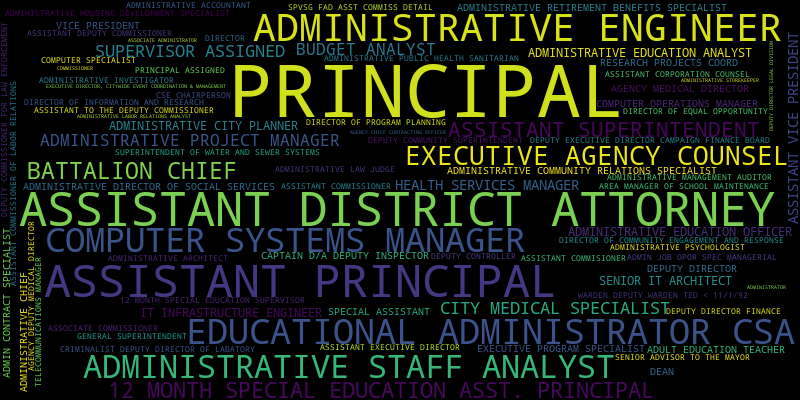

Quantile 996: 174520 - 176218, 552 salaries


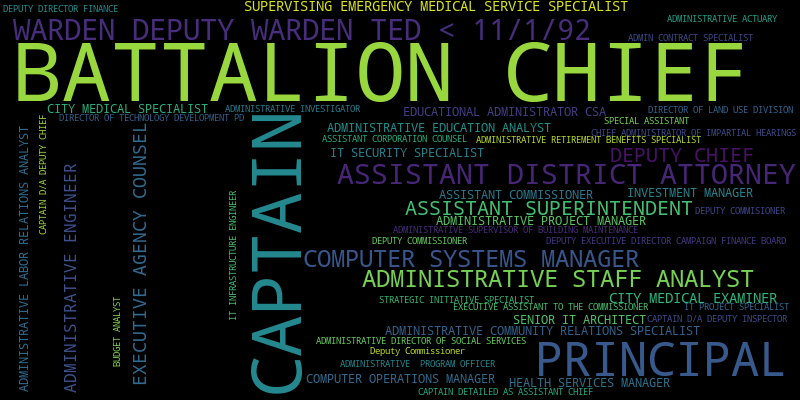

Quantile 997: 176218 - 181650, 552 salaries


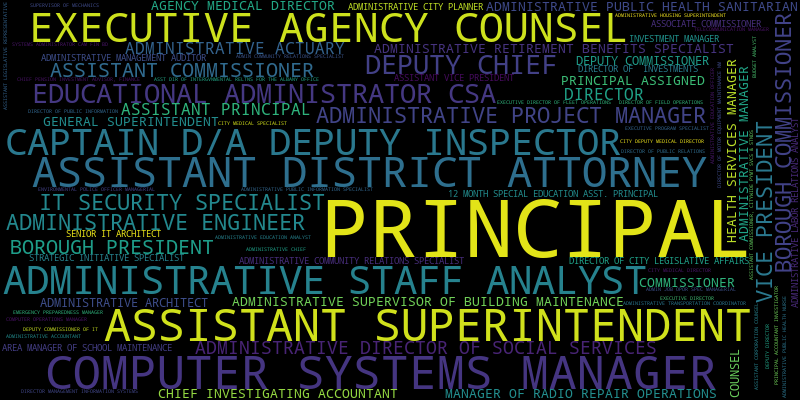

Quantile 998: 181660 - 185886, 552 salaries


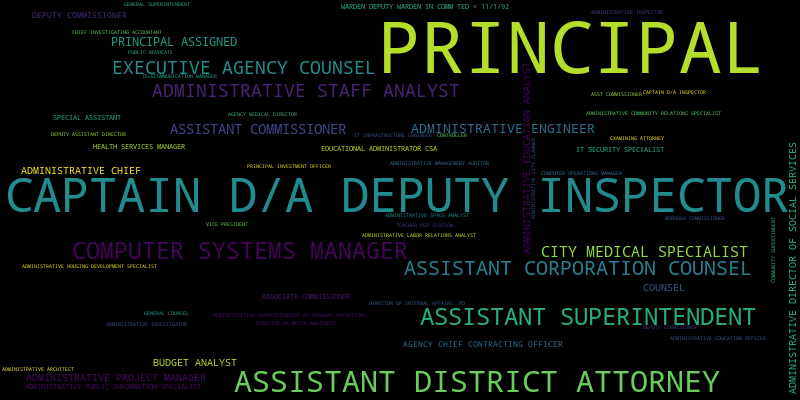

Quantile 999: 185886 - 191371, 552 salaries


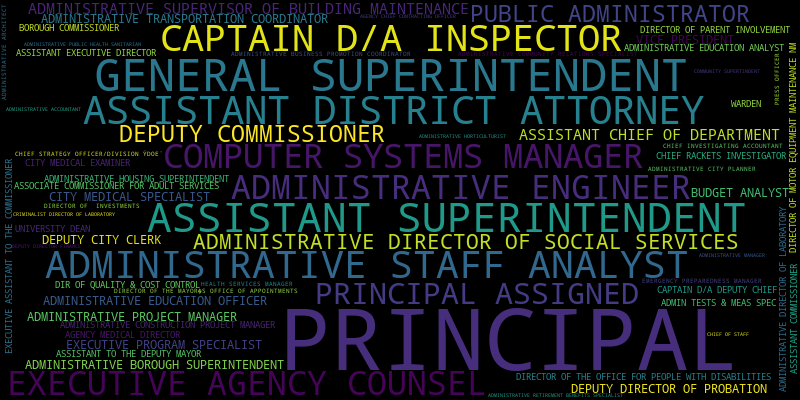

Quantile 1000: 191371 - 409058, 1490 salaries


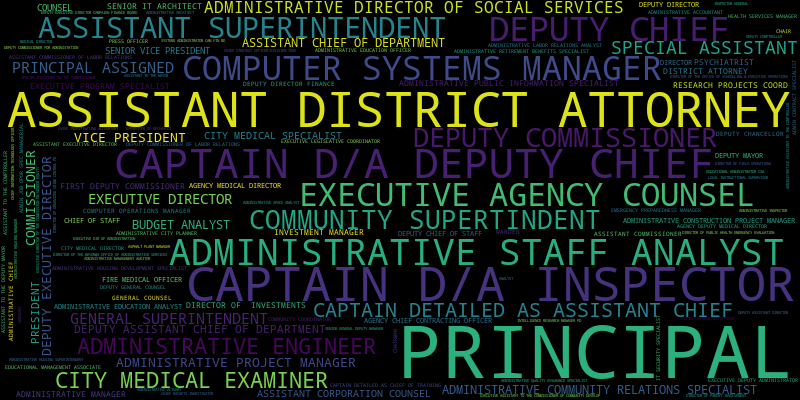

In [15]:
make_wordclouds(title_salary, 1000, 990)

# Adding n-grams of tokenized titles

## Deciles
This shows word clouds for titles, unigrams, and bigrams, by decile.

Quantile 1: -82023 - 547, 55293 salaries


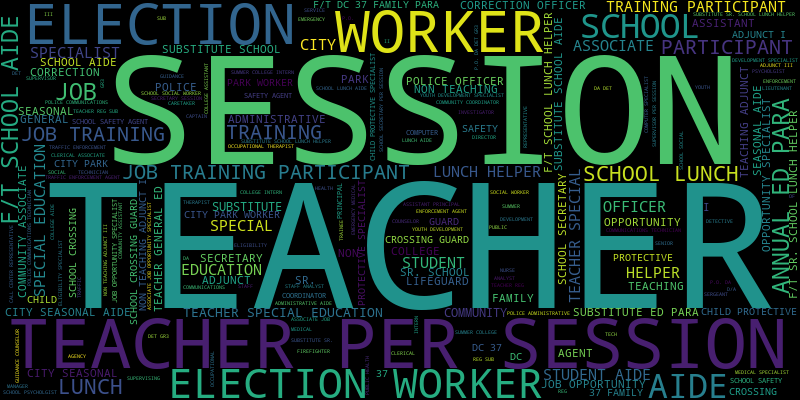

Quantile 2: 547 - 2528, 55293 salaries


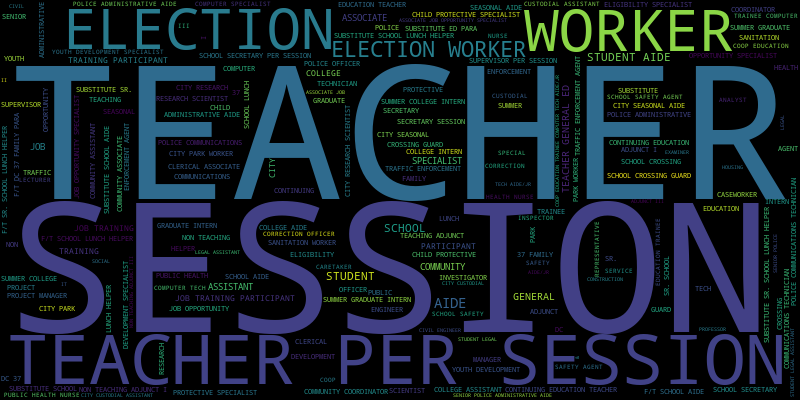

Quantile 3: 2528 - 8267, 55293 salaries


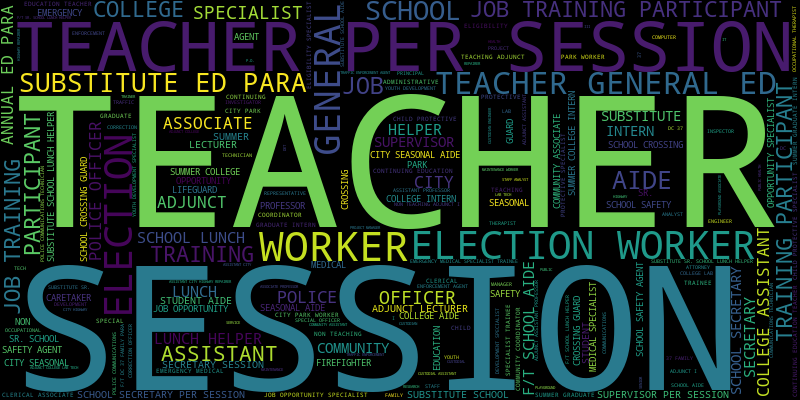

Quantile 4: 8267 - 20432, 55293 salaries


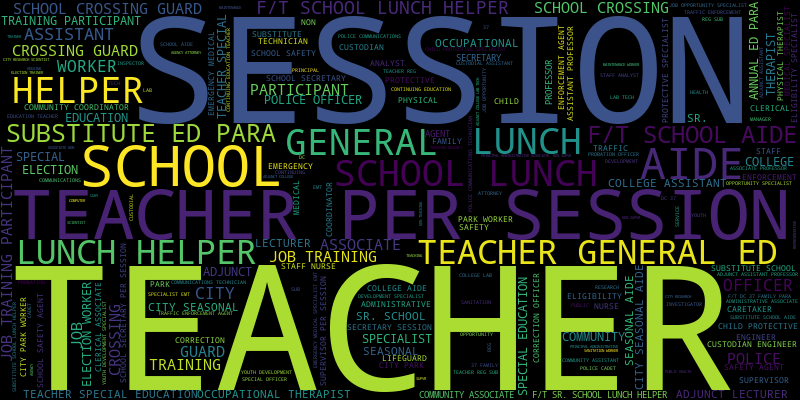

Quantile 5: 20432 - 39242, 55293 salaries


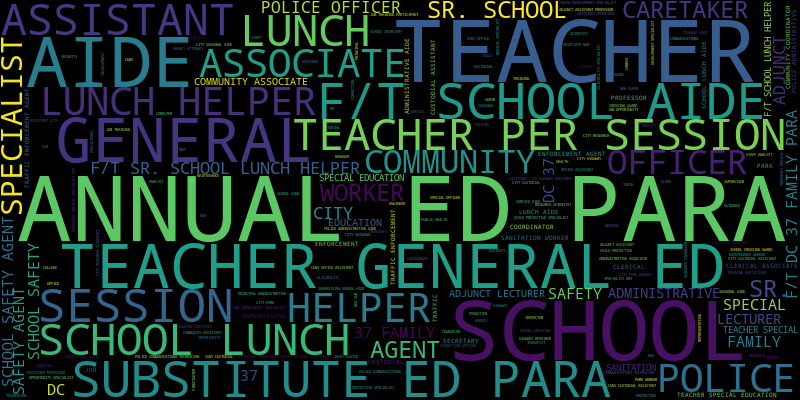

Quantile 6: 39243 - 52545, 55293 salaries


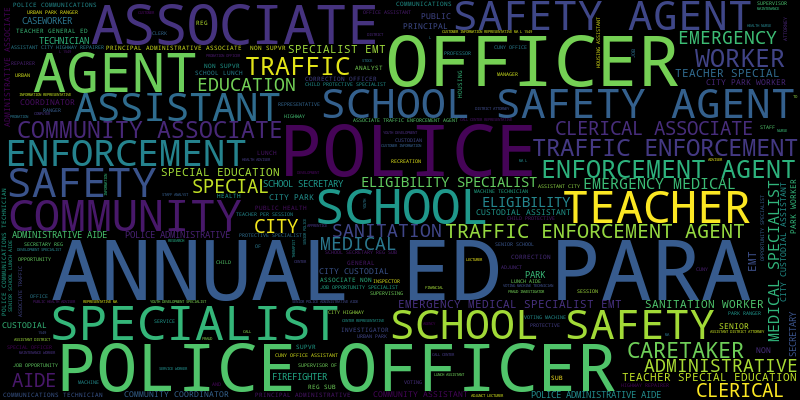

Quantile 7: 52545 - 74253, 55293 salaries


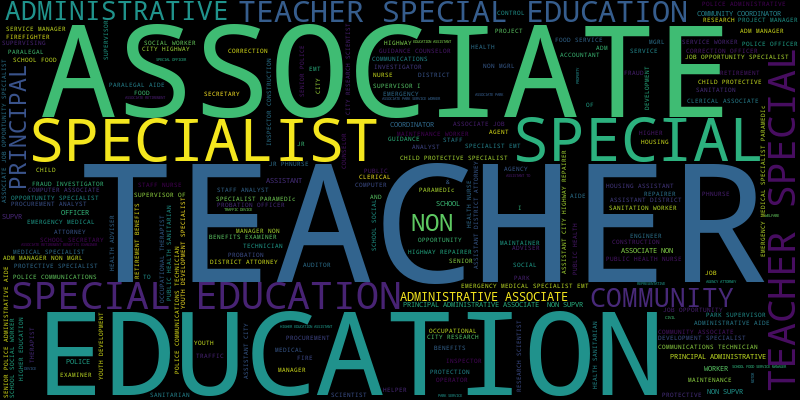

Quantile 8: 74253 - 91444, 55293 salaries


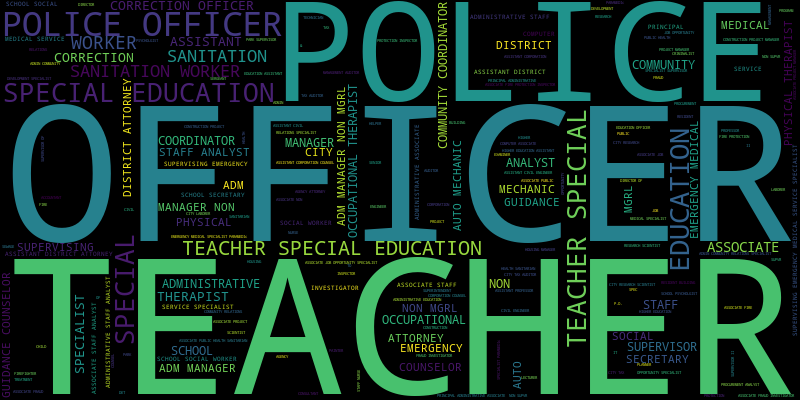

Quantile 9: 91444 - 109852, 55293 salaries


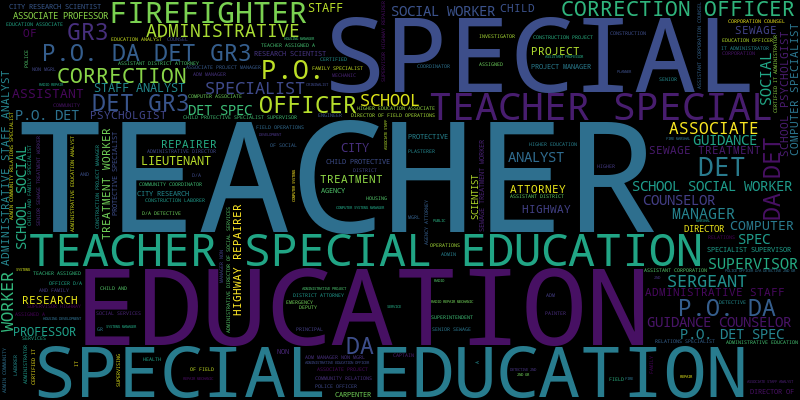

Quantile 10: 109852 - 409058, 55301 salaries


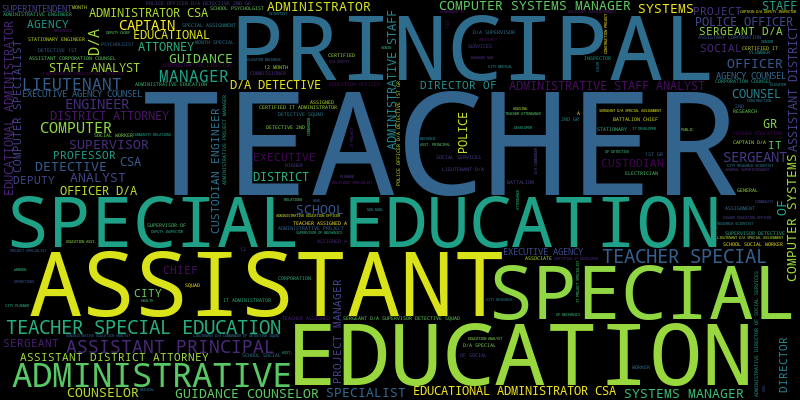

In [16]:
make_wordclouds(title_salary, add_ngrams=NGrams.UNI | NGrams.BI, stop_list={'per', 'para', 'ed', 'f/t'})

## Top Decile By Percentile
This shows word clouds for titles, unigrams, and bigrams, by percentile for the top decile.

Quantile 91: 109852 - 111349, 5529 salaries


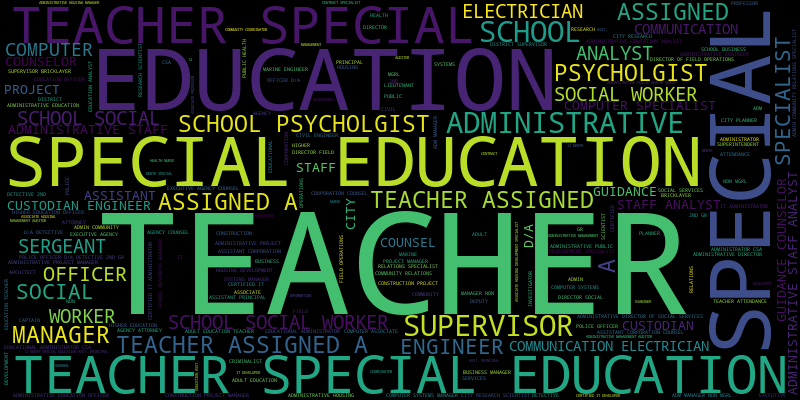

Quantile 92: 111349 - 115764, 5529 salaries


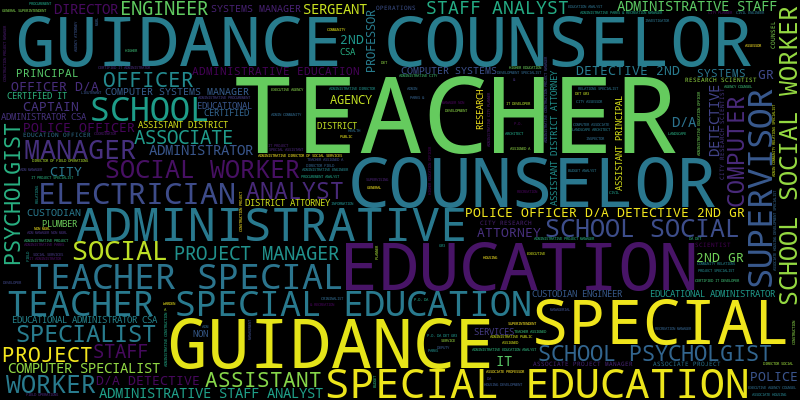

Quantile 93: 115764 - 118509, 5529 salaries


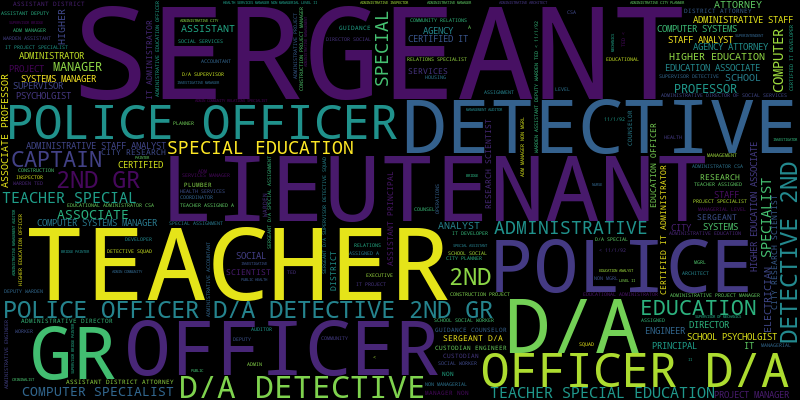

Quantile 94: 118509 - 121611, 5529 salaries


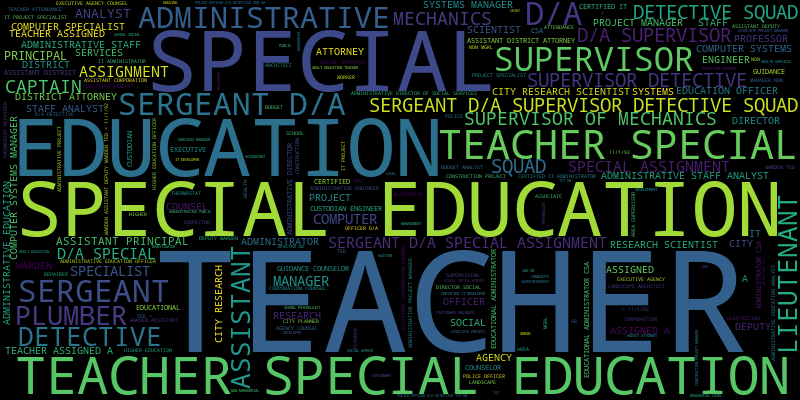

Quantile 95: 121611 - 125756, 5529 salaries


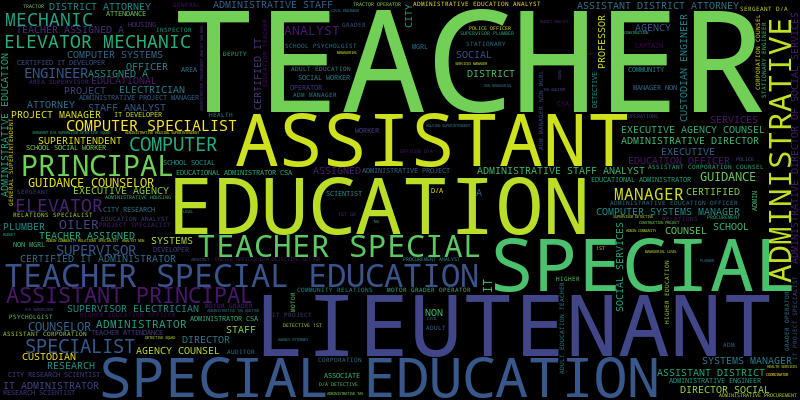

Quantile 96: 125759 - 128657, 5529 salaries


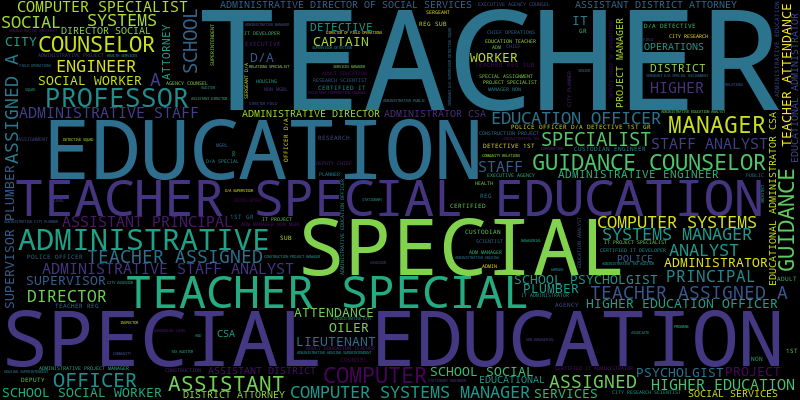

Quantile 97: 128657 - 132288, 5529 salaries


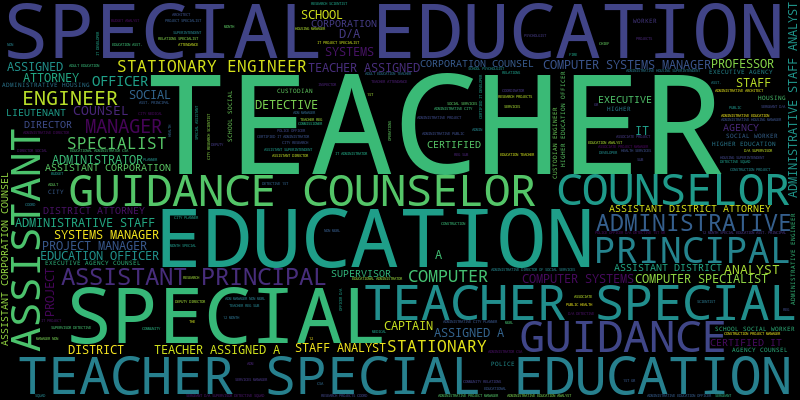

Quantile 98: 132288 - 140532, 5529 salaries


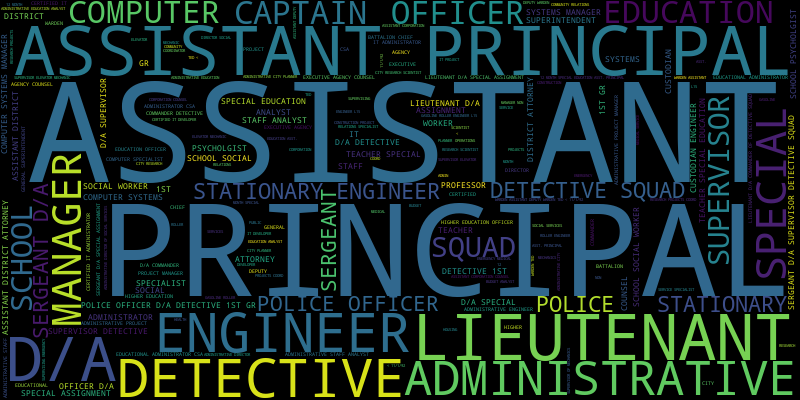

Quantile 99: 140532 - 160962, 5529 salaries


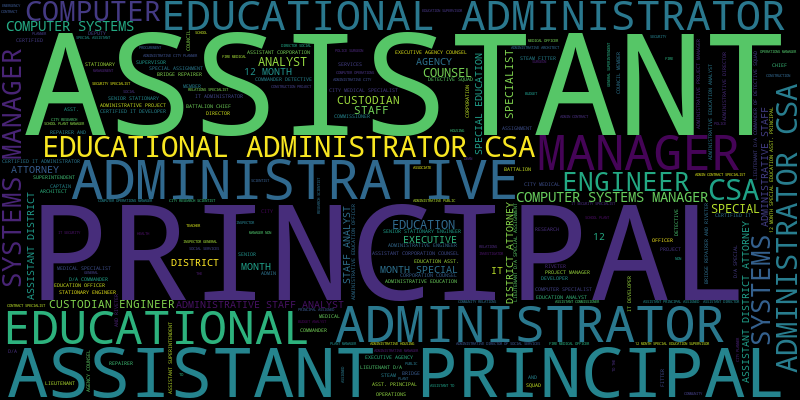

Quantile 100: 160962 - 409058, 5567 salaries


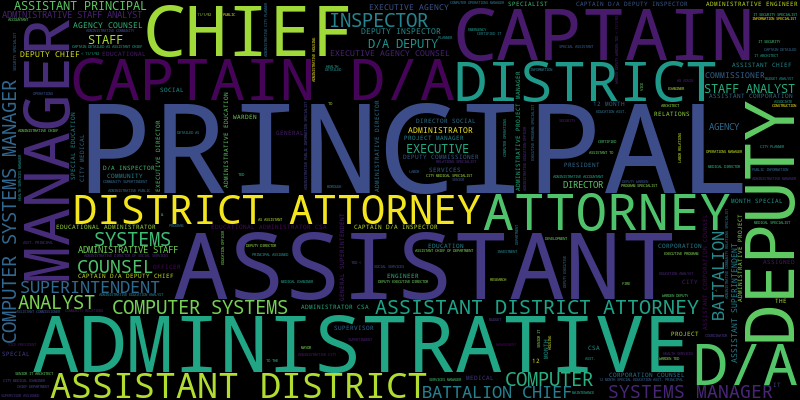

In [17]:
make_wordclouds(title_salary, 100, 90, add_ngrams=NGrams.UNI | NGrams.BI, stop_list={'of'})

## The 1%
This shows word clouds for titles, unigrams, and bigrams, by tenth-of-a-percentile for the top percentile.

Quantile 991: 155512 - 158839, 552 salaries


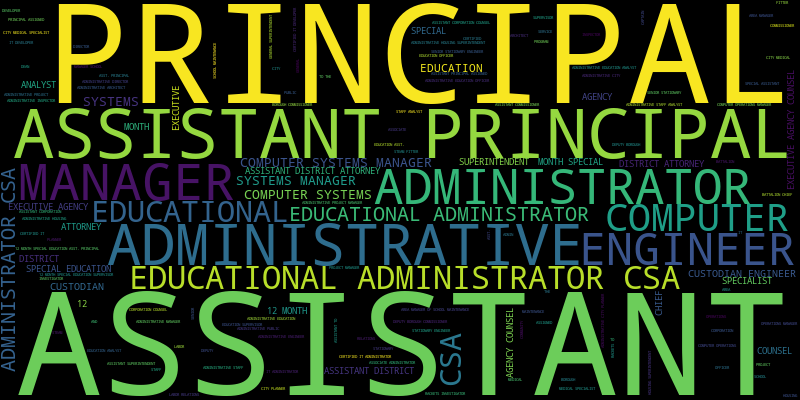

Quantile 992: 158852 - 162839, 552 salaries


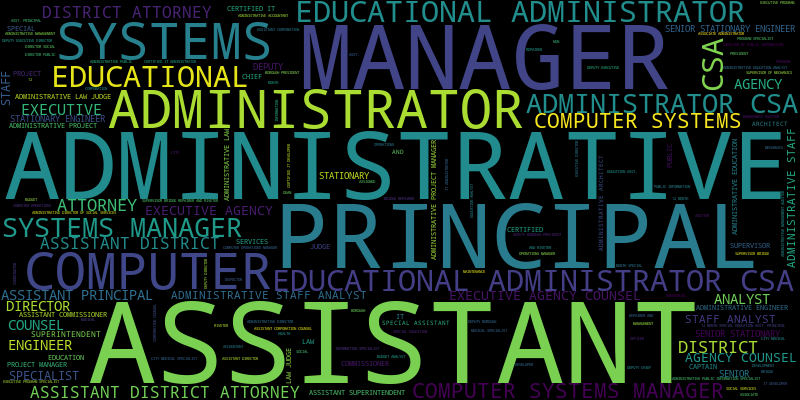

Quantile 993: 162849 - 166786, 552 salaries


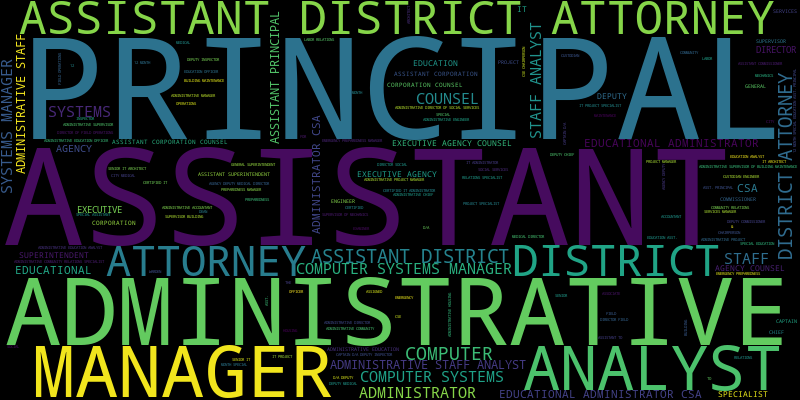

Quantile 994: 166803 - 169834, 552 salaries


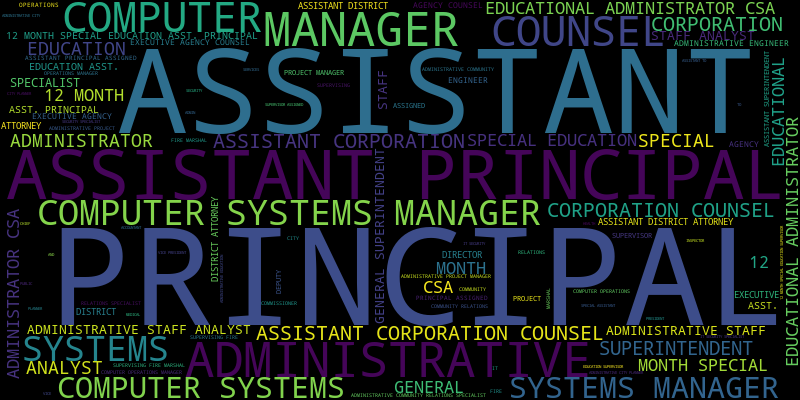

Quantile 995: 169834 - 174520, 552 salaries


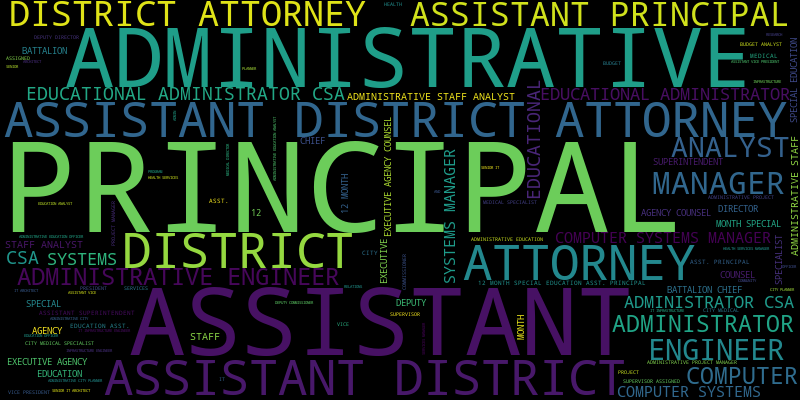

Quantile 996: 174520 - 176218, 552 salaries


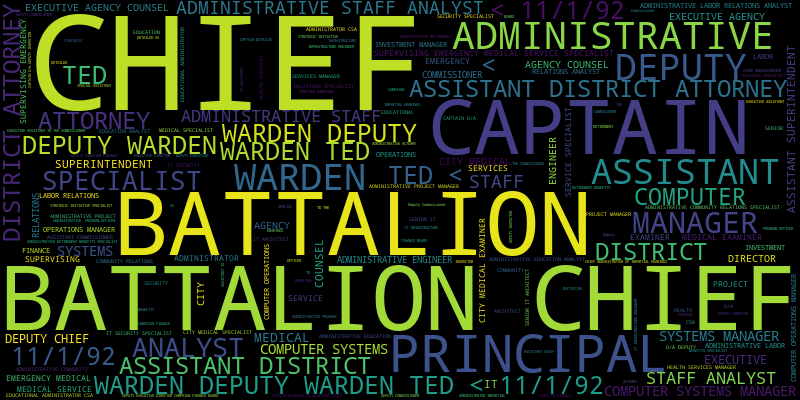

Quantile 997: 176218 - 181650, 552 salaries


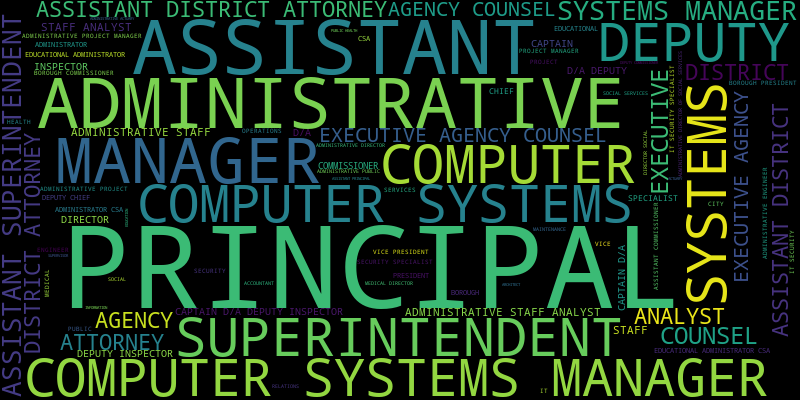

Quantile 998: 181660 - 185886, 552 salaries


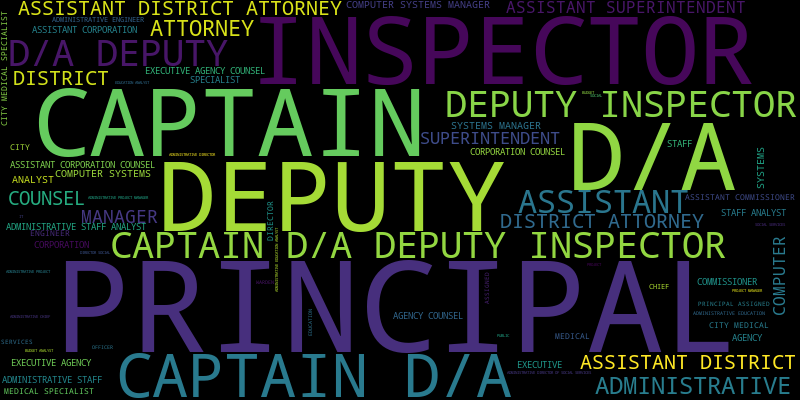

Quantile 999: 185886 - 191371, 552 salaries


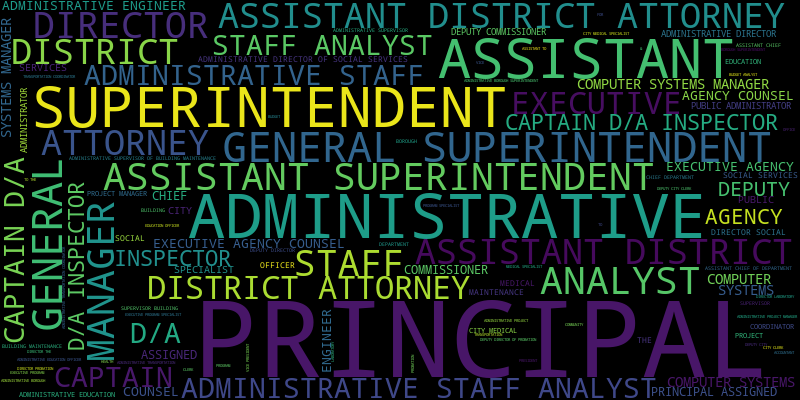

Quantile 1000: 191371 - 409058, 1490 salaries


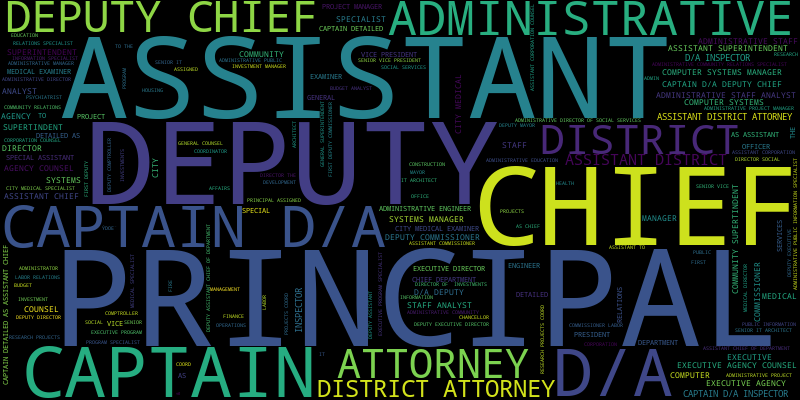

In [18]:
make_wordclouds(title_salary, 1000, 990, add_ngrams=NGrams.UNI | NGrams.BI, stop_list={'of'})